In [1]:
import torch
import torchvision
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt
import torchvision.models as models
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
import cv2

In [2]:
SEED = 1

# Use GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
print('Current Device:', device)

Current Device: cpu


## CAM

In [49]:
# Displays CAM and prediction.
#  img:           numpy array with shape (img_height, img_width, img_channels)
#  target_class:  prediction class
def cam(img, model, target_class=1, transform=None):
    model.eval()

    sample_img = transforms.ToTensor()(img)
    if transform != None:
        sample_img = transform(sample_img)
    sample_img = sample_img.unsqueeze(0).to(device)
    model.to(device)
    feats = model.get_features(sample_img).data.cpu().numpy()
    
    # Get prediction probability for target class
    output = model(sample_img)
    logits = F.softmax(output, dim=1).squeeze()
    pred_logit = logits[target_class].item()
    print('Probability: {:.5f}%'.format(pred_logit*100))

    _, nc, h, w = feats.shape
    r = feats.reshape((nc, h*w))

    params = list(model.parameters())
    weight = np.squeeze(params[-2].data.cpu().numpy())

    c = weight[target_class] @ r
    c = c.reshape((h, w))
    c = c - np.min(c)
    c = c / np.max(c)
    c_i = np.uint8(255 * c)
    c_i = cv2.resize(c_i, (img.shape[1], img.shape[0]))

    img = np.uint8(img)
    heatmap = cv2.cvtColor(cv2.applyColorMap(c_i, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
    result = np.uint8(0.3 * heatmap + 0.5 * img)

    # Plot original image and CAM side-by-side
    plt.figure(1, figsize=(12,8))
    img_plot = plt.subplot(121)
    img_plot.axis('off')
    img_plot.imshow(img)
    cam_plot = plt.subplot(122)
    cam_plot.axis('off')
    cam_plot.imshow(result)
    plt.show()

### Test 1: Pre-Trained ImageNet

In [50]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]     # ImageNet mean and std
IMAGENET_STD = [0.229, 0.224, 0.225]

IMAGENET_TRANSFORMS = transforms.Compose(
    [
        transforms.ToPILImage(),
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ]
)

In [51]:
from models.model import Resnet18

model_default_imagenet = Resnet18()
model_default_imagenet.load_state_dict(torch.load('./models/default_imagenet.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [52]:
IMAGENET_CHAINSAW_CLASS = 491

In [53]:
chainsaws = [
    'datasets/imagenette/imagenette2/val/n03000684/ILSVRC2012_val_00011951.JPEG',
    'datasets/imagenette/imagenette2/val/n03000684/n03000684_35991.JPEG'
]

not_chainsaws = [
    'datasets/imagenette/imagenette2/val/n03394916/ILSVRC2012_val_00007921.JPEG',
    'datasets/imagenette/imagenette2/val/n03445777/n03445777_261.JPEG',
    'examples/tabby_cat.jpg'
]

Probability: 87.75302%


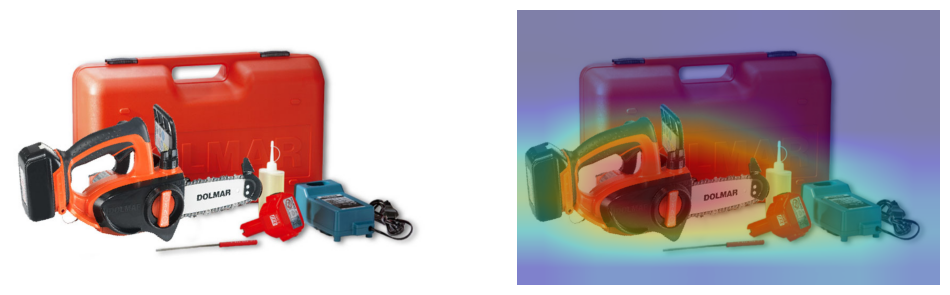

Probability: 89.55557%


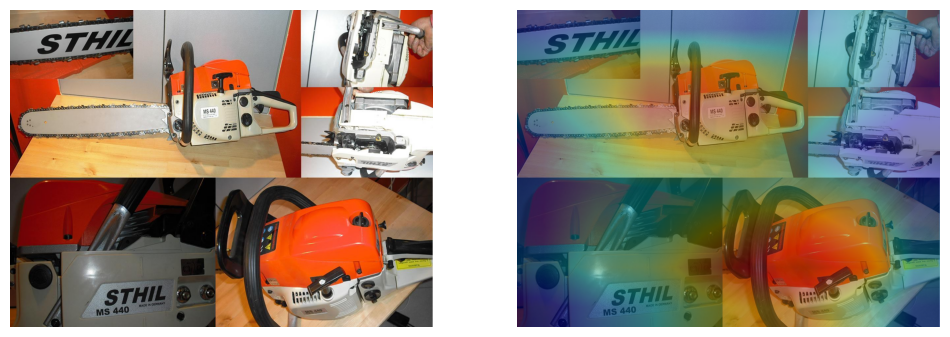

In [54]:
for im_path in chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_default_imagenet, IMAGENET_CHAINSAW_CLASS, IMAGENET_TRANSFORMS)

Probability: 0.00040%


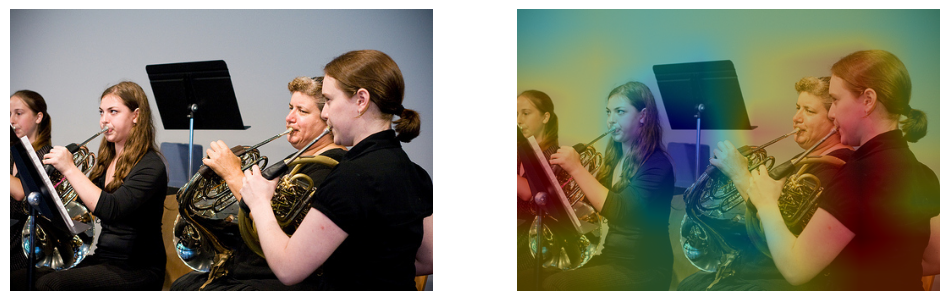

Probability: 0.00119%


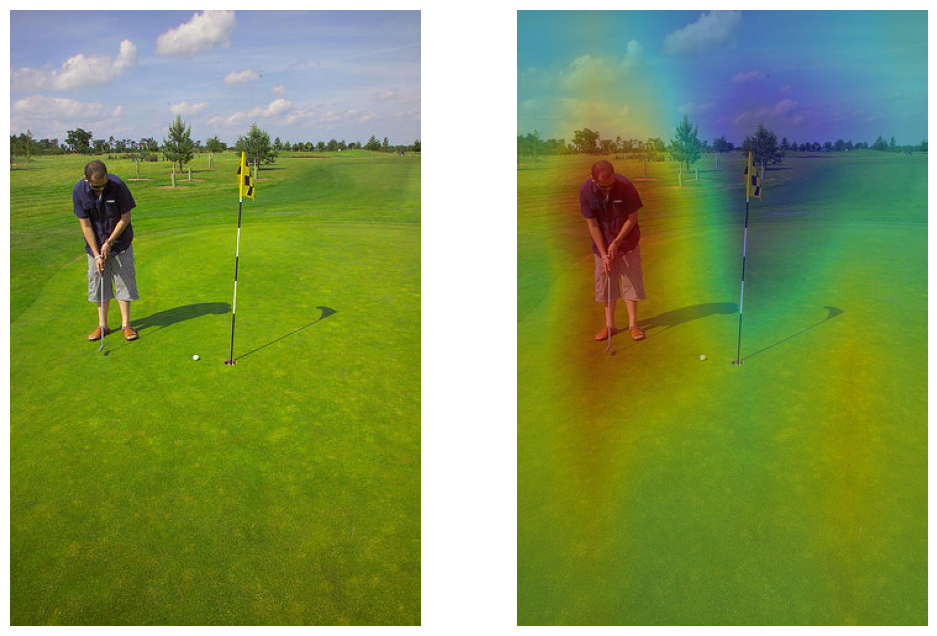

Probability: 0.00076%


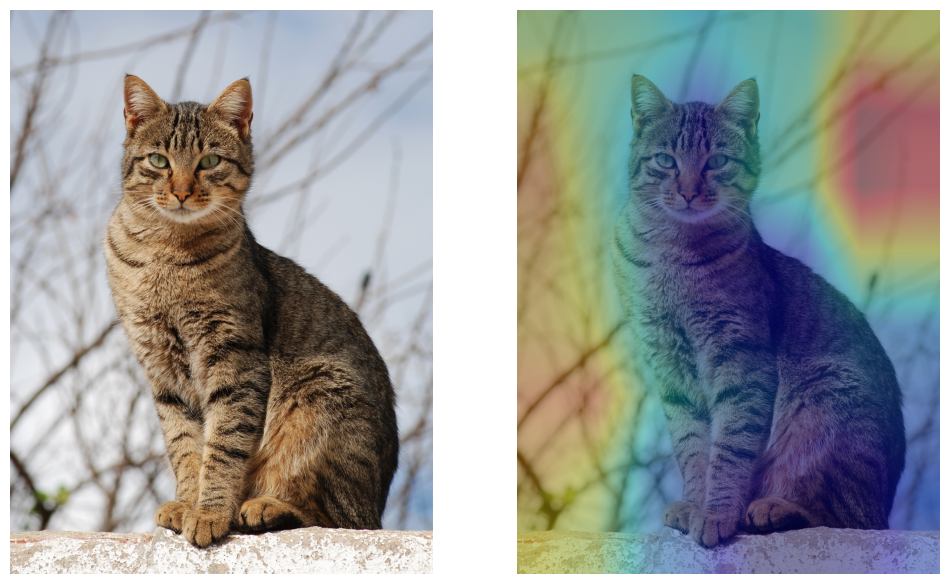

In [55]:
for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_default_imagenet, IMAGENET_CHAINSAW_CLASS, IMAGENET_TRANSFORMS)

Probability: 0.00005%


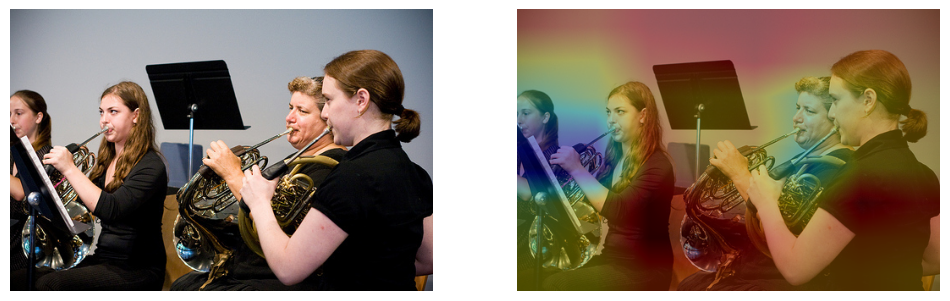

Probability: 0.00008%


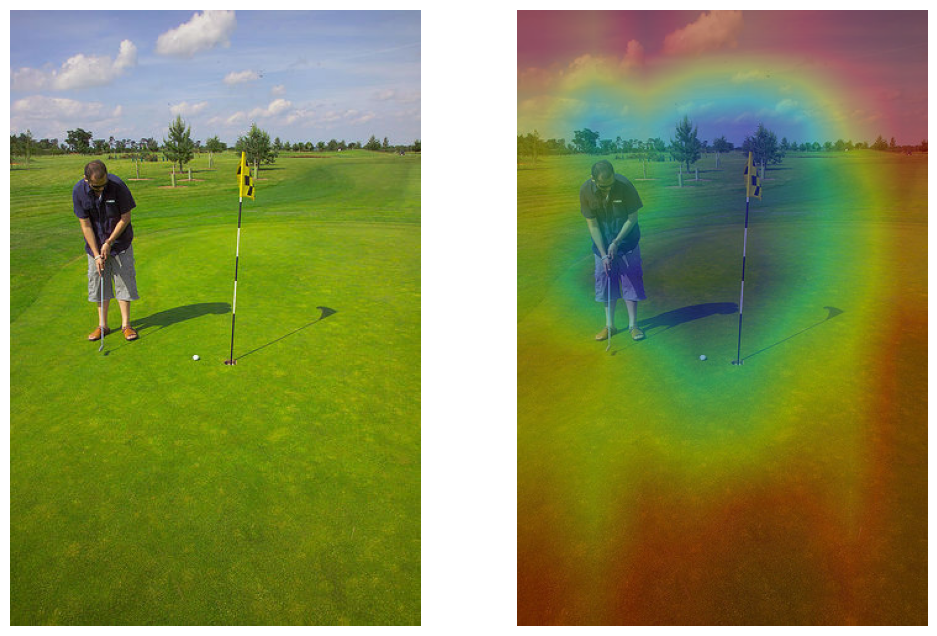

Probability: 29.61389%


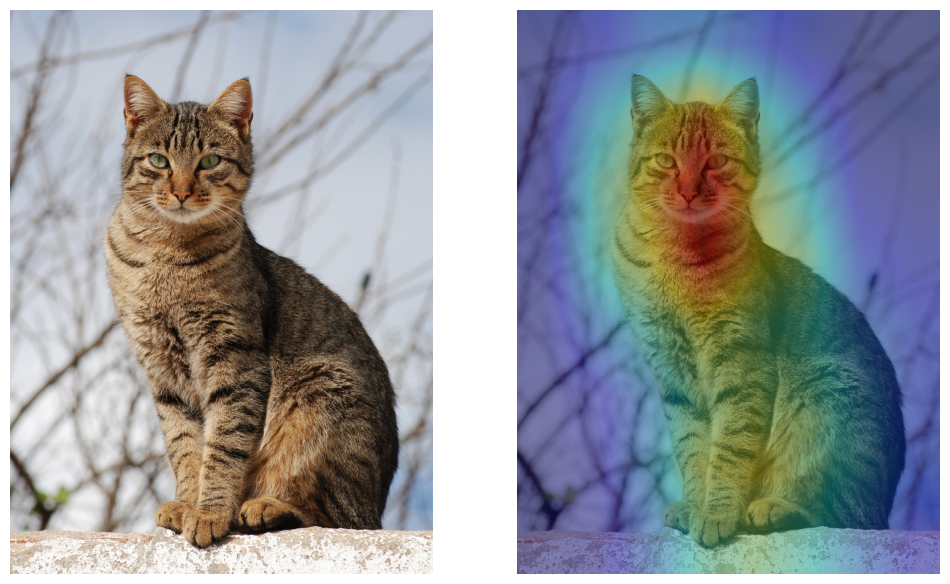

In [56]:
IMAGENET_TABBY_CLASS = 281

for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_default_imagenet, IMAGENET_TABBY_CLASS, IMAGENET_TRANSFORMS)

### Test 2: Emergency Vehicles

In [22]:
from models.model import CNNClassifier

model_emergency_vehicles = CNNClassifier(num_classes=2)
model_emergency_vehicles.load_state_dict(torch.load('./models/2024-04-22-20-49-emergency_vehicles.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [23]:
im_paths = [
    './examples/emergency_vehicles/8.jpg',
    './examples/emergency_vehicles/13.jpg',
    './examples/emergency_vehicles/18.jpg',
    './examples/emergency_vehicles/2311.jpg',
    './examples/emergency_vehicles/2312.jpg',
    './examples/emergency_vehicles/2317.jpg',
]

Probability: 2.47467%


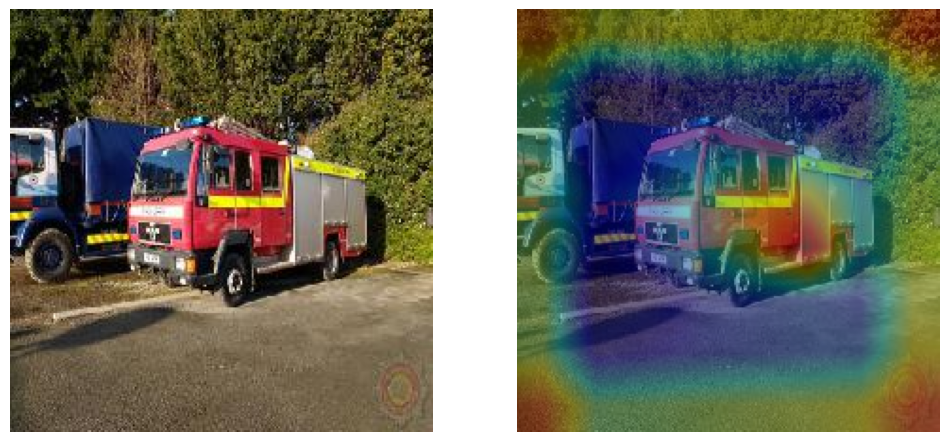

Probability: 99.99985%


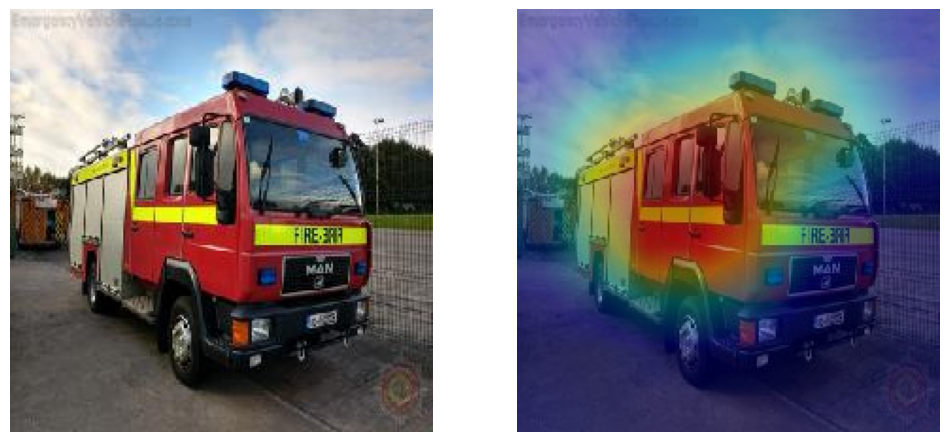

Probability: 99.99572%


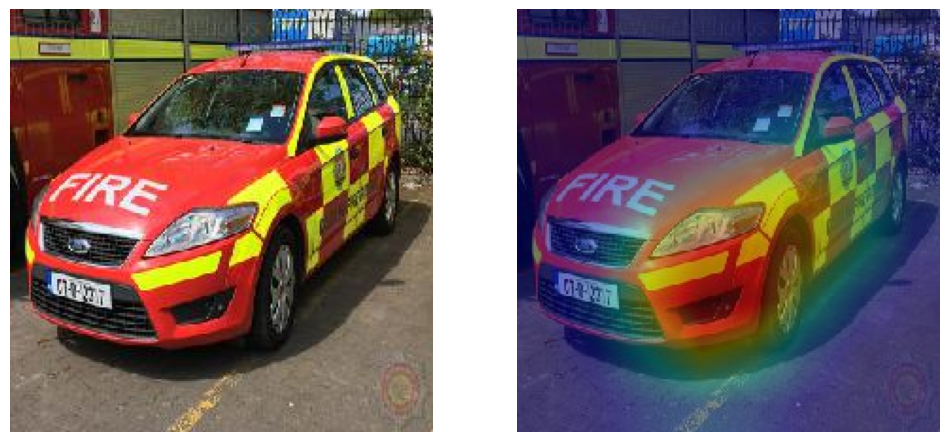

Probability: 1.63922%


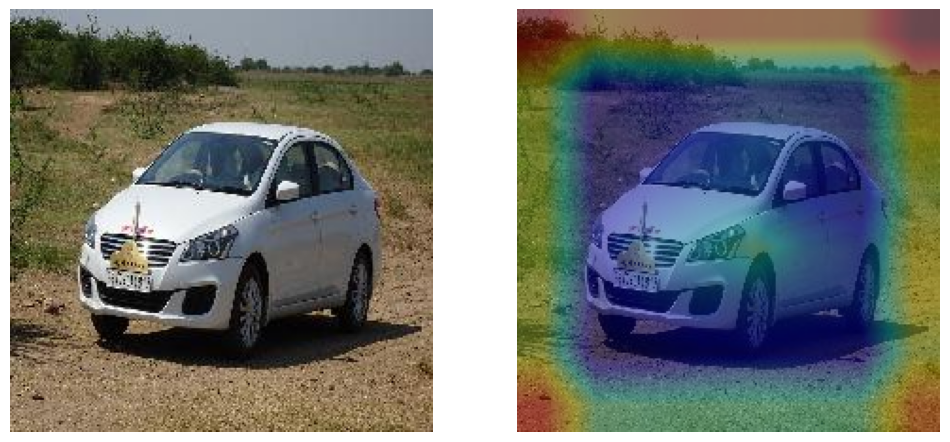

Probability: 9.62819%


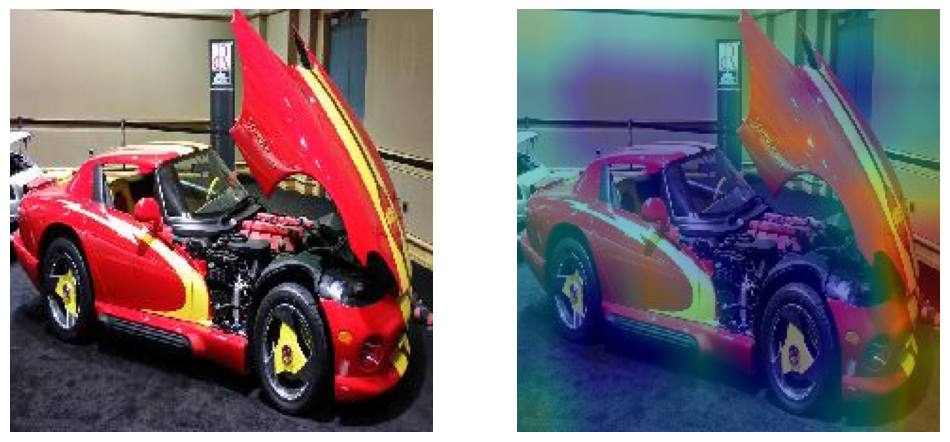

Probability: 2.19461%


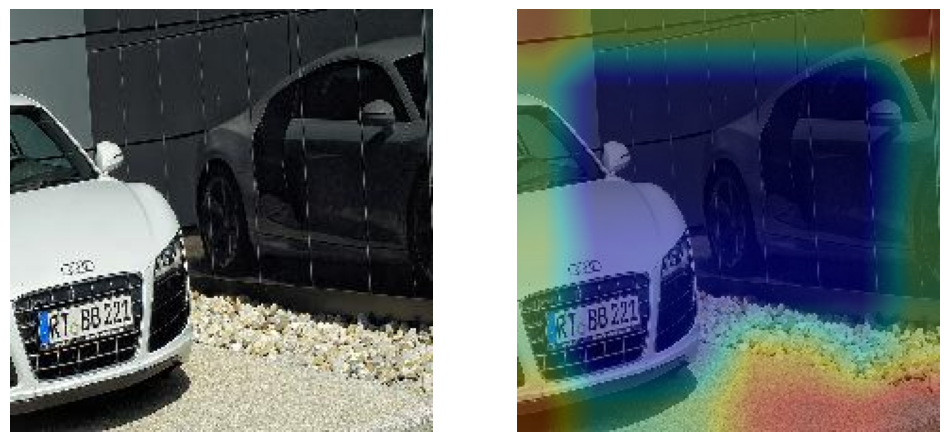

In [24]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_emergency_vehicles, target_class=0)

### Test 3: Waldo

In [18]:
model_waldo = CNNClassifier(num_classes=2)
model_waldo.load_state_dict(torch.load('./models/waldo.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [19]:
im_paths = [
    './examples/waldo/notwaldo/sz64_1_0_3.jpg',
    './examples/waldo/notwaldo/sz128_6_4_2.jpg',
    './examples/waldo/notwaldo/sz256_21_2_1.jpg',
    './examples/waldo/waldo/sz64_4_2_11.jpg',
    './examples/waldo/waldo/sz128_9_0_6.jpg',
    './examples/waldo/waldo/sz256_16_2_0.jpg'
]

Probability: 100.00000%


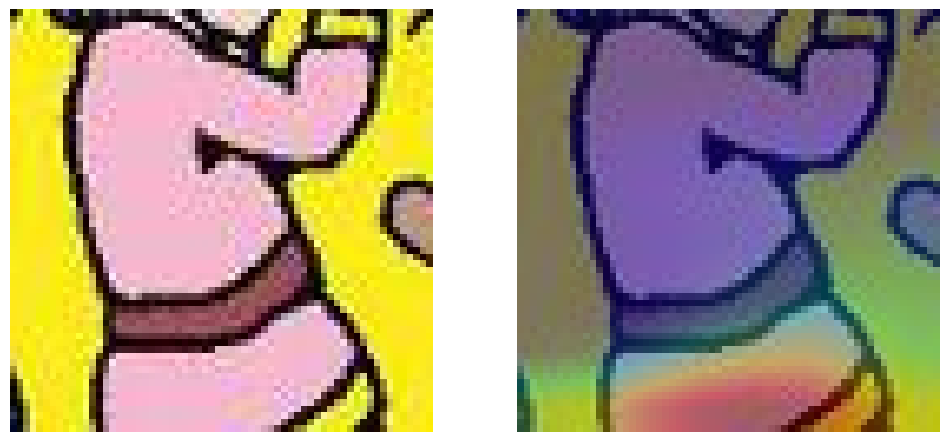

Probability: 100.00000%


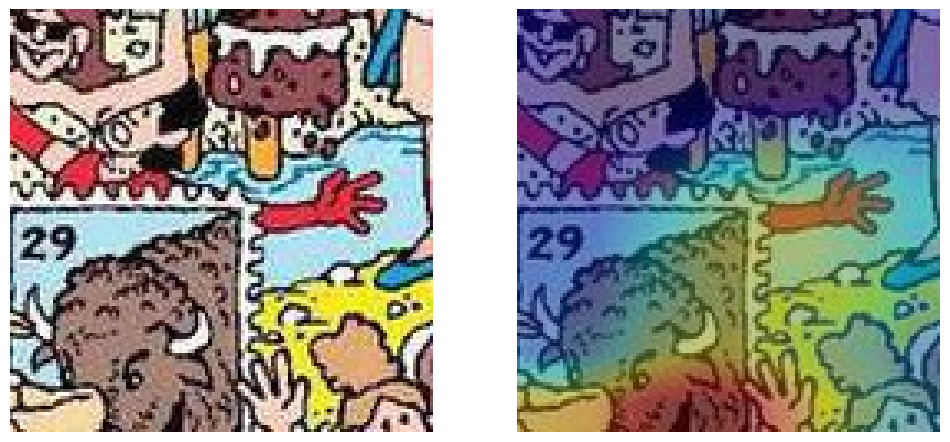

Probability: 100.00000%


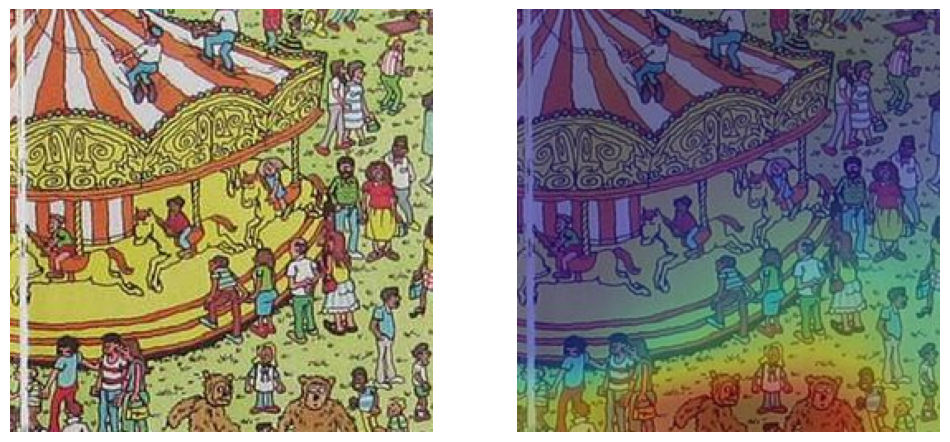

Probability: 100.00000%


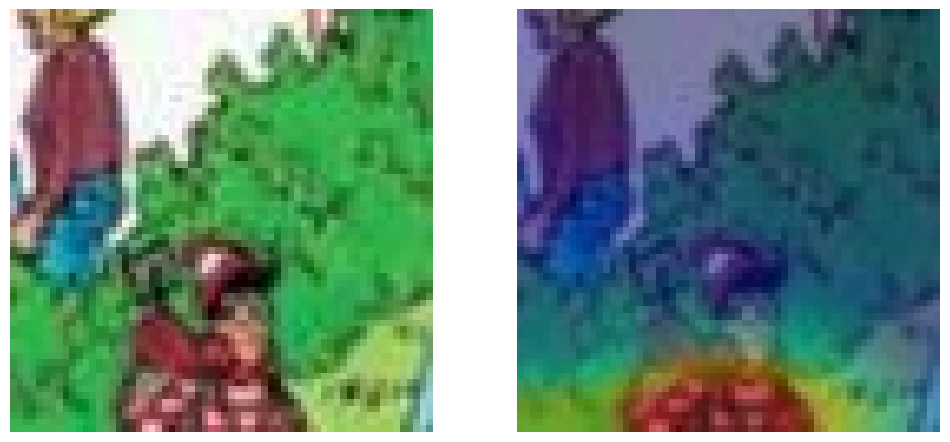

Probability: 100.00000%


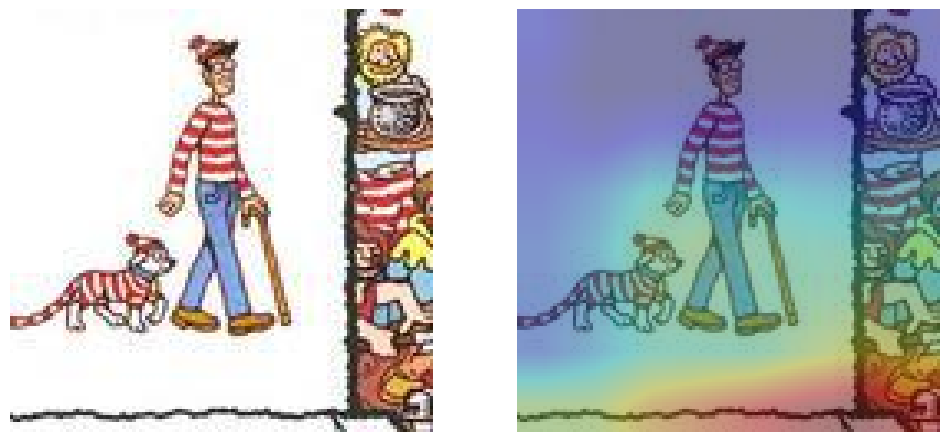

Probability: 100.00000%


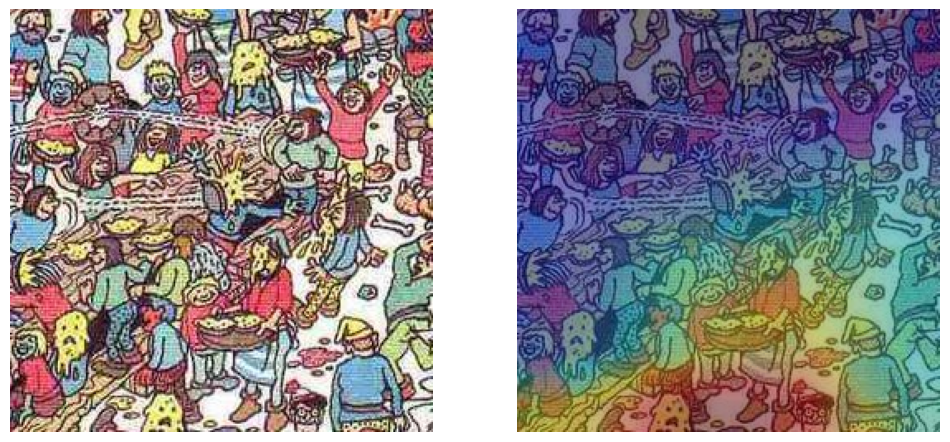

In [21]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_waldo, target_class=1)